In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
arnavs19_underwater_plastic_pollution_detection_path = kagglehub.dataset_download('arnavs19/underwater-plastic-pollution-detection')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arnavs19/underwater-plastic-pollution-detection")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/underwater-plastic-pollution-detection


In [ ]:
# Step 1: Install Ultralytics
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 89.3 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is

In [ ]:
# Step 1: Import YOLO
from ultralytics import YOLO

# Step 2: Load YOLOv10 model (e.g., nano version)
model = YOLO("yolov10s.pt")  # Options: yolov10n.pt, yolov10s.pt, yolov10m.pt, etc.

# Step 3: Train with your configuration
model.train(
    data="/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml",
    epochs=60,
    imgsz=640,
    batch=32,
    optimizer="Adam",
    lr0=0.001,
    weight_decay=0.0005,
    warmup_epochs=3,
    name="yolov10s-underwater-80ep"
)

Ultralytics 8.3.130 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov10s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov10s-underwater-80ep2, nbs=64, nms=False, opset=None, optimize=False, optimizer=A

train: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/labels... 3628 images, 2 backgrounds, 0 corrupt: 100%|██████████| 3628/3628 [00:04<00:00, 875.99it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.1±0.2 ms, read: 86.0±57.2 MB/s, size: 45.9 KB)


val: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid/labels... 1001 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1001/1001 [00:01<00:00, 527.22it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid is not writeable, cache not saved.


Plotting labels to runs/detect/yolov10s-underwater-80ep2/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 99 weight(decay=0.0), 112 weight(decay=0.0005), 111 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolov10s-underwater-80ep2
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      11.1G      3.029      8.982      3.256         55        640: 100%|██████████| 114/114 [01:20<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.444      0.118     0.0872     0.0522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60      10.9G      3.253      5.055      3.392         70        640: 100%|██████████| 114/114 [01:19<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]


                   all       1001       1891       0.36      0.112     0.0681     0.0334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60      11.4G      3.203      4.782      3.331         46        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]


                   all       1001       1891      0.466      0.152      0.111     0.0603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60      11.5G      3.192      4.669      3.329         58        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]


                   all       1001       1891      0.462      0.164      0.113     0.0592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60      11.4G      3.122      4.441      3.277         55        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.735      0.202      0.205      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60      11.4G      3.045      4.289      3.234         54        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.562      0.227      0.226      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60      10.9G      3.007      4.112      3.191         46        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.722      0.194      0.198      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60      11.5G      2.915      3.918      3.135         50        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.721      0.243      0.252      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60      11.4G      2.903      3.767      3.118         42        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all       1001       1891      0.729      0.273      0.303      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60      11.4G      2.901      3.592      3.096         75        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.674      0.312       0.32      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60      11.4G      2.831      3.517      3.052         46        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.531      0.301      0.307      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60      11.6G      2.794      3.403      3.018         55        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.639      0.302      0.343      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60      10.9G      2.769      3.368      3.018         56        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.573      0.364      0.362      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60      11.4G      2.758      3.326      2.985         36        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.638      0.307      0.357      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60      10.9G      2.697      3.198      2.984         67        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.477      0.326      0.369      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60      11.4G        2.7      3.093      2.951         41        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.547      0.409      0.434      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60      11.4G      2.667      3.089      2.953         35        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]

                   all       1001       1891      0.685      0.358      0.424      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60      11.4G      2.628      3.015      2.939         48        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891       0.59      0.357      0.385      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60      11.4G      2.656      2.969      2.946         58        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.538      0.394      0.414      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60      11.4G      2.607      2.913      2.904         63        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.635        0.4      0.419      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60      10.9G      2.625      2.834      2.902         48        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all       1001       1891        0.5      0.411      0.439      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60      11.5G      2.566        2.8      2.874         97        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.696      0.391      0.437      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60      11.5G      2.557      2.779      2.872         37        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.645       0.41      0.474      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60      11.4G      2.538      2.706      2.862         59        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all       1001       1891      0.485      0.438       0.47      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60      11.4G       2.52      2.695      2.843         73        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891       0.49      0.492       0.47      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60      11.4G      2.492      2.599      2.818         87        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.459      0.431       0.46      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60      11.4G       2.47      2.527       2.79         39        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.618      0.416      0.465      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60      11.4G      2.475      2.508      2.807         52        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all       1001       1891      0.495      0.481       0.49      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60      11.5G      2.467      2.478      2.803         48        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.603      0.493      0.536      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60      11.4G      2.451      2.459      2.799         41        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.599      0.445      0.485      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60      11.5G      2.427      2.407      2.775         83        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all       1001       1891      0.493      0.507      0.485      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60      11.4G      2.415      2.375       2.77         43        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.471      0.549      0.547      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60      11.4G      2.401      2.374      2.761         45        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.553      0.486      0.507      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60      11.4G      2.368      2.292      2.735         33        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.703      0.464      0.542       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60      11.4G      2.386      2.292      2.734         49        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.496      0.517      0.526      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60      11.4G      2.346      2.234      2.724         69        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.603      0.558      0.577      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60      11.5G       2.31      2.169      2.689         37        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.654      0.571      0.575      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60      11.4G      2.315      2.188      2.691         65        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.531      0.586      0.558      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60      11.4G      2.293       2.15      2.686         36        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.565      0.532      0.565      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60      11.4G      2.251      2.066      2.668         50        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.664      0.514      0.588      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60      11.4G      2.273      2.073      2.683         56        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.593       0.57      0.599       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60      11.4G      2.263      2.046      2.654         57        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.663      0.554      0.604      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60      11.4G      2.236      1.977      2.635         56        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.559      0.574      0.611      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60      11.4G      2.201      1.974      2.627         48        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all       1001       1891      0.631      0.597      0.638      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60      11.5G      2.204      1.973      2.624         71        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]

                   all       1001       1891      0.629      0.546      0.593      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60      11.5G      2.179       1.91      2.619         46        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.737      0.564      0.642      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60      11.5G      2.179      1.884       2.61         38        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]

                   all       1001       1891      0.636      0.623      0.646      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60      11.4G      2.137      1.824      2.578         56        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.654      0.639      0.669      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60      11.4G      2.099      1.796      2.546         28        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.664      0.598      0.648      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60      11.4G      2.096      1.793      2.559         31        640: 100%|██████████| 114/114 [01:18<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.669      0.625      0.668      0.424


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60      11.5G      1.991      1.373      2.555         29        640: 100%|██████████| 114/114 [01:19<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]

                   all       1001       1891      0.754      0.609      0.695      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60      11.4G      1.946      1.268      2.499         22        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.727       0.61      0.673      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60      11.4G      1.905      1.228      2.502         22        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.764       0.63      0.716      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60      11.4G      1.883      1.174      2.462         36        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all       1001       1891      0.693       0.65      0.688      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60      11.4G      1.866      1.143      2.449         21        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]

                   all       1001       1891      0.729      0.658      0.709      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60      11.4G      1.838      1.133      2.447         40        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891       0.75      0.656      0.727      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60      11.5G      1.826      1.114      2.438         38        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.89it/s]

                   all       1001       1891      0.673      0.682      0.716      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60      11.5G      1.796       1.07       2.41         33        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.90it/s]

                   all       1001       1891      0.674      0.689      0.733      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60      11.4G      1.771      1.054      2.378         33        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.93it/s]

                   all       1001       1891      0.716      0.691      0.737      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60      11.4G      1.755      1.036      2.382         24        640: 100%|██████████| 114/114 [01:18<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.91it/s]

                   all       1001       1891      0.744      0.687      0.735      0.481



60 epochs completed in 1.467 hours.
Optimizer stripped from runs/detect/yolov10s-underwater-80ep2/weights/last.pt, 16.5MB
Optimizer stripped from runs/detect/yolov10s-underwater-80ep2/weights/best.pt, 16.5MB

Validating runs/detect/yolov10s-underwater-80ep2/weights/best.pt...
Ultralytics 8.3.130 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv10s summary (fused): 106 layers, 7,223,805 parameters, 0 gradients, 21.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.75it/s]


                   all       1001       1891      0.716      0.692      0.738      0.484
                  Mask         77         90      0.955      0.469      0.747      0.572
                   can         18         20      0.545        0.6      0.631      0.243
             cellphone         61         71      0.923      0.944      0.974      0.866
           electronics         27         40      0.697      0.725      0.749      0.488
               gbottle         36         82      0.708       0.72      0.743      0.547
                 glove         37         55      0.897      0.795      0.848      0.706
                 metal         10         22      0.474      0.247      0.369        0.2
                  misc         48         51       0.54      0.725      0.566      0.295
                   net        146        148      0.814      0.885       0.91      0.631
                  pbag        290        330      0.849      0.988      0.979      0.844
               pbottl

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 5.1ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/yolov10s-underwater-80ep2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c3ac14ce250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

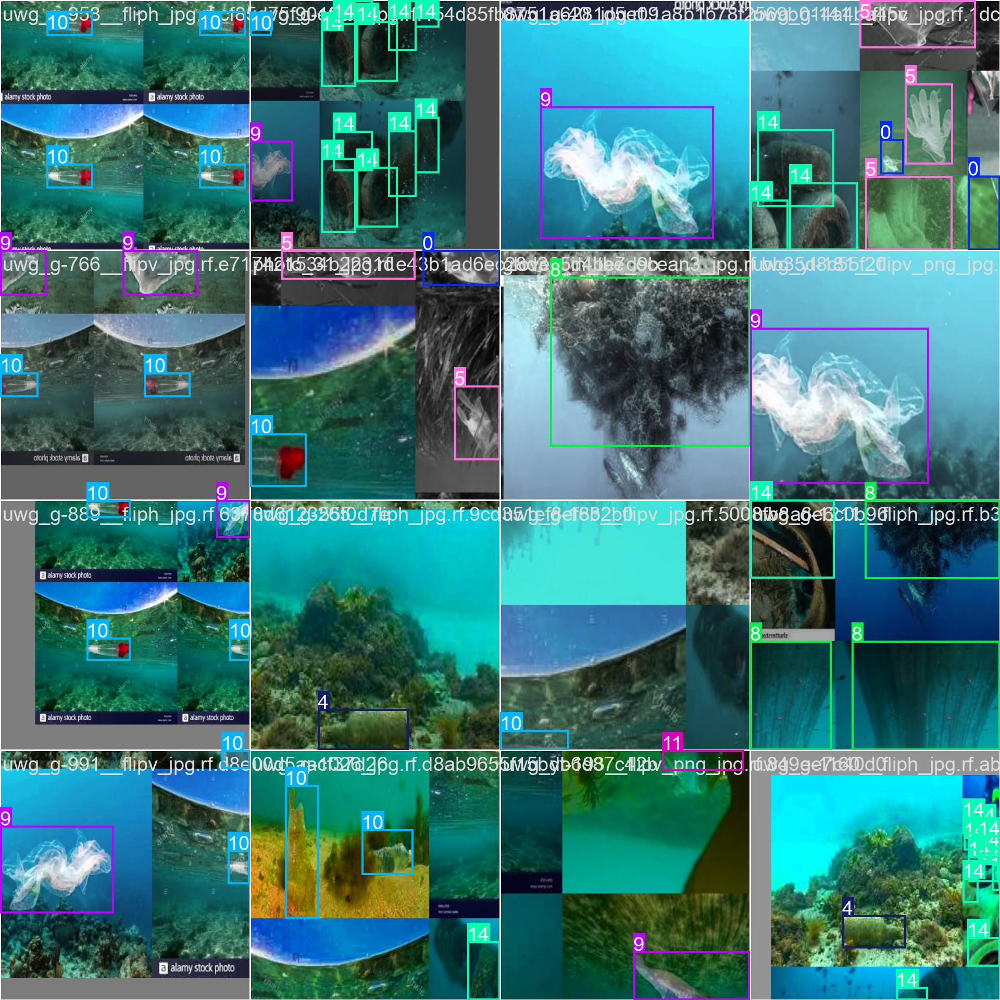

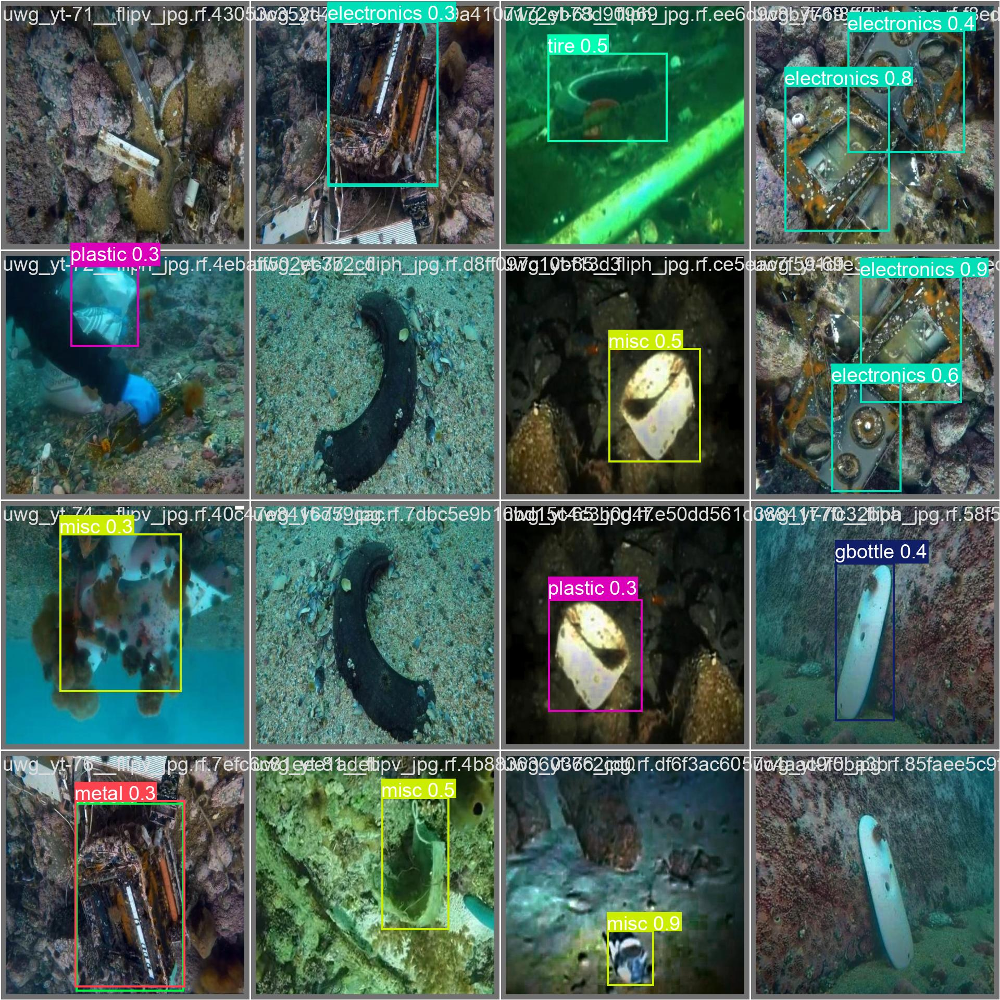

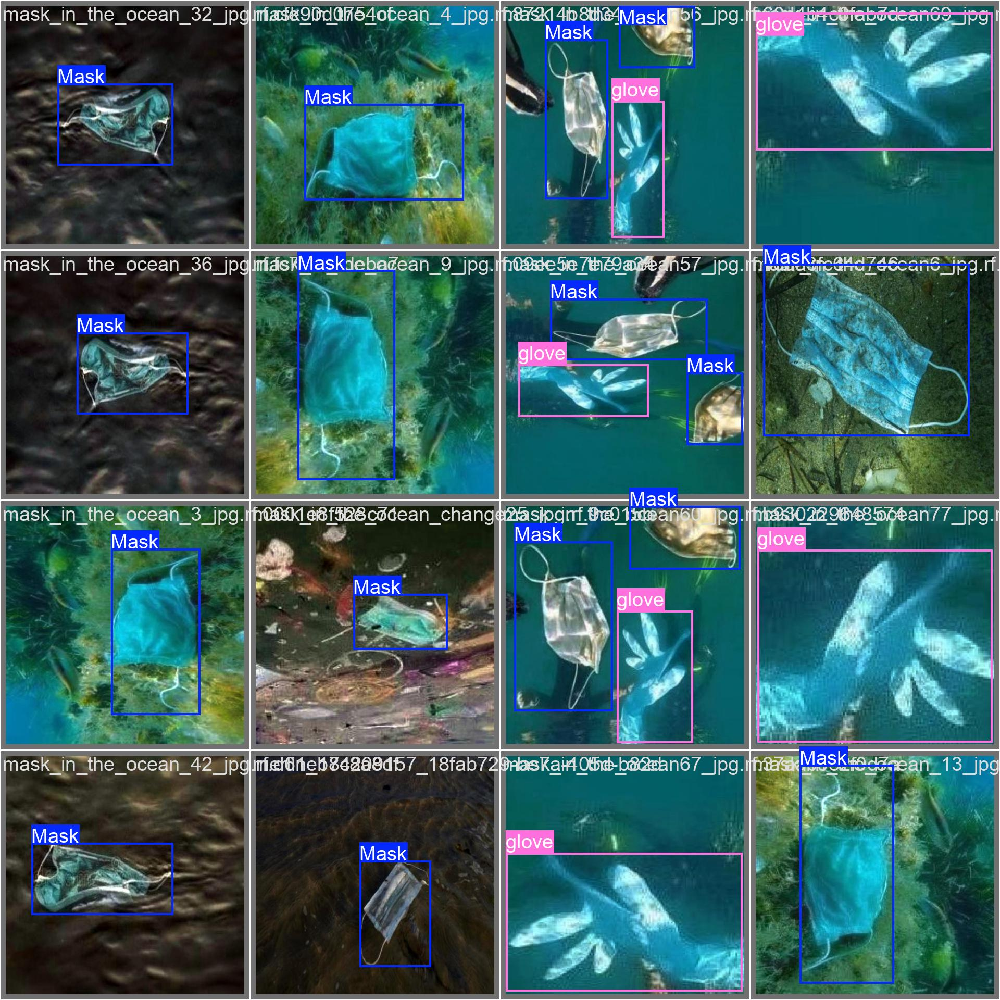

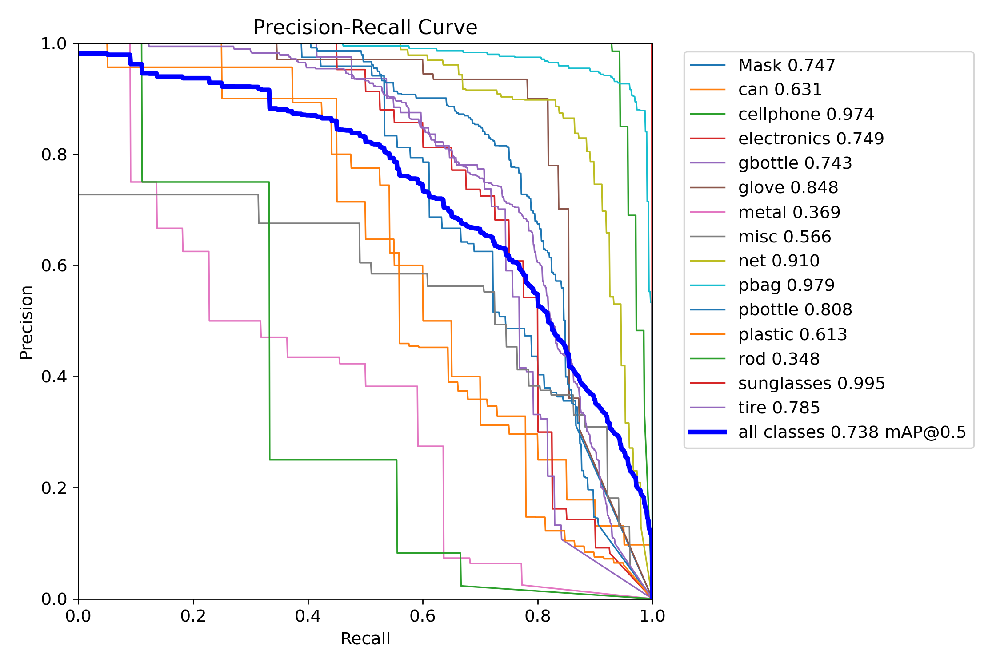

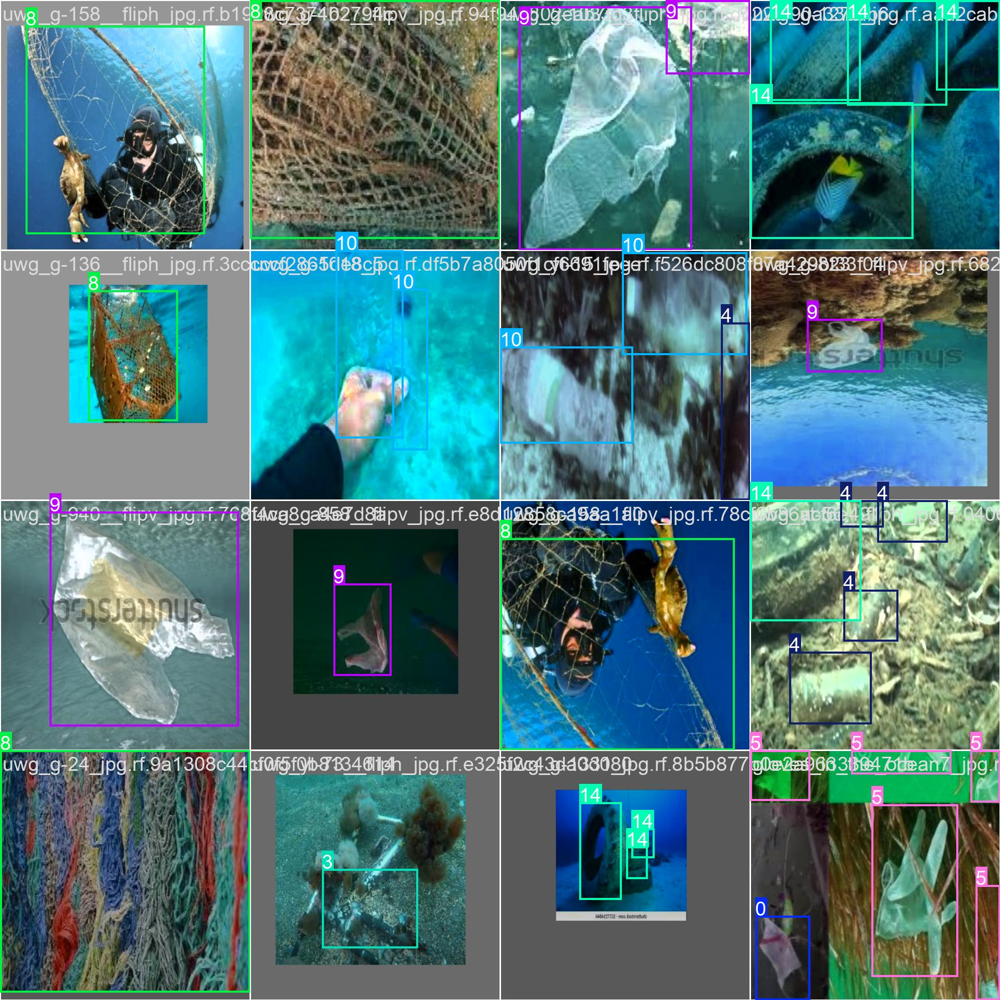

...

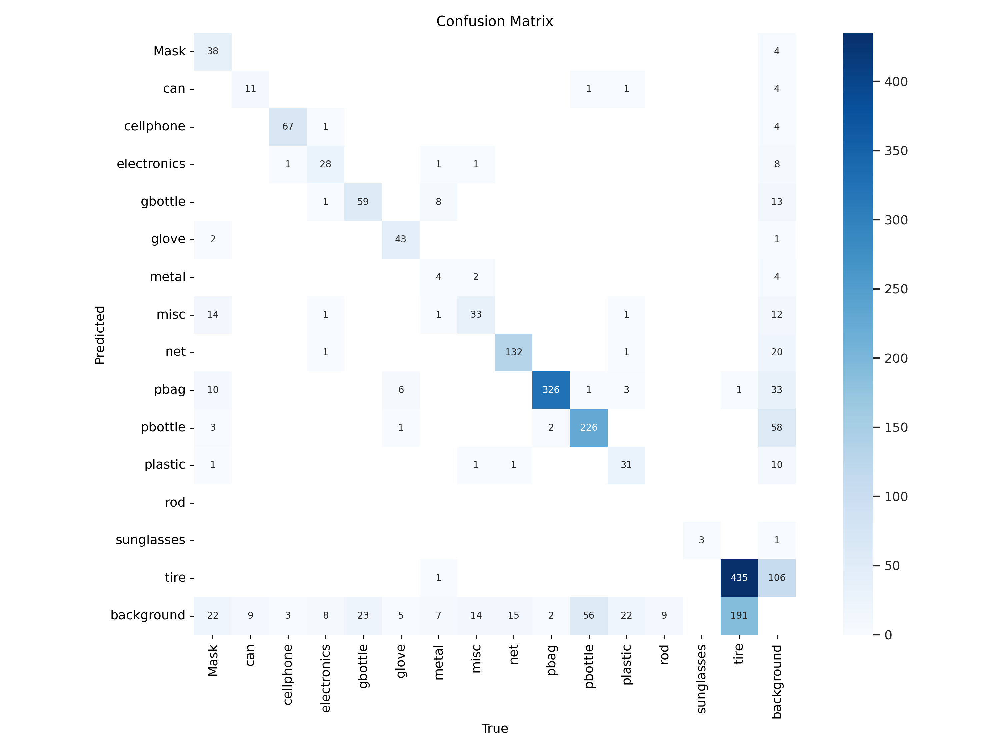

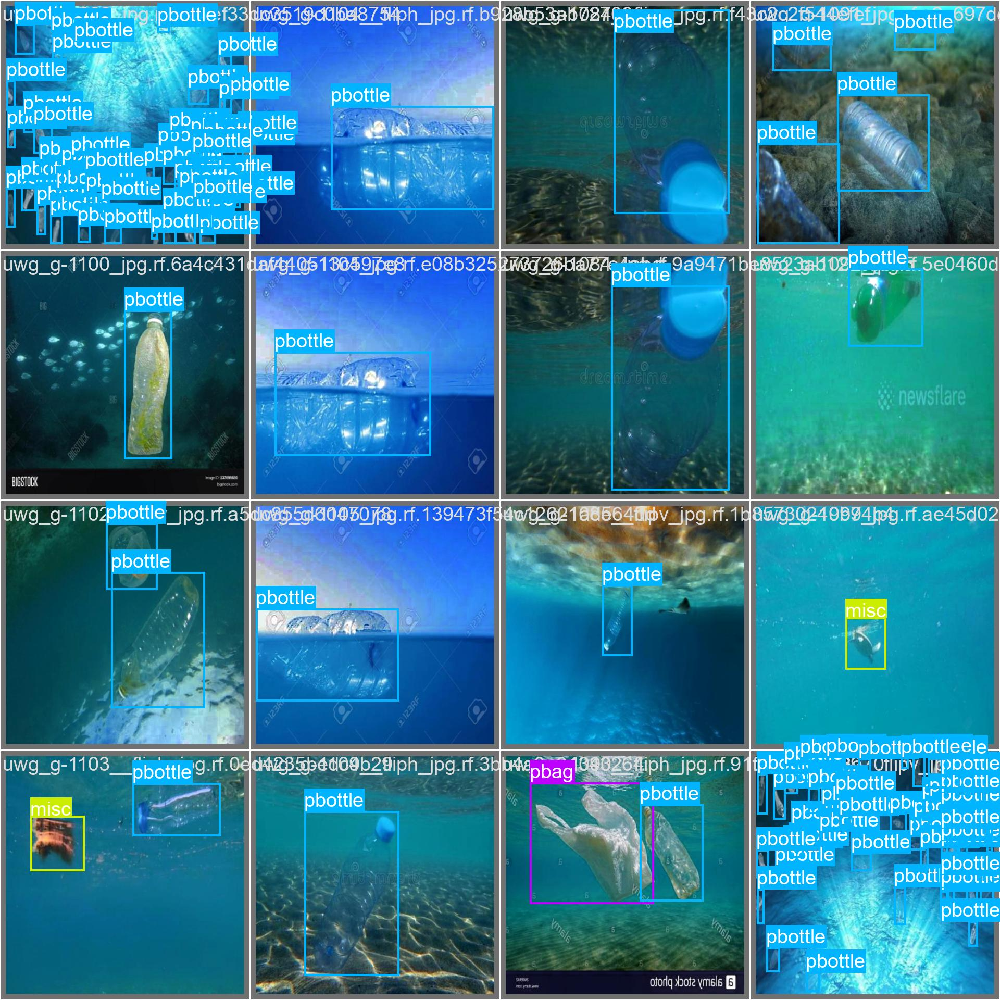

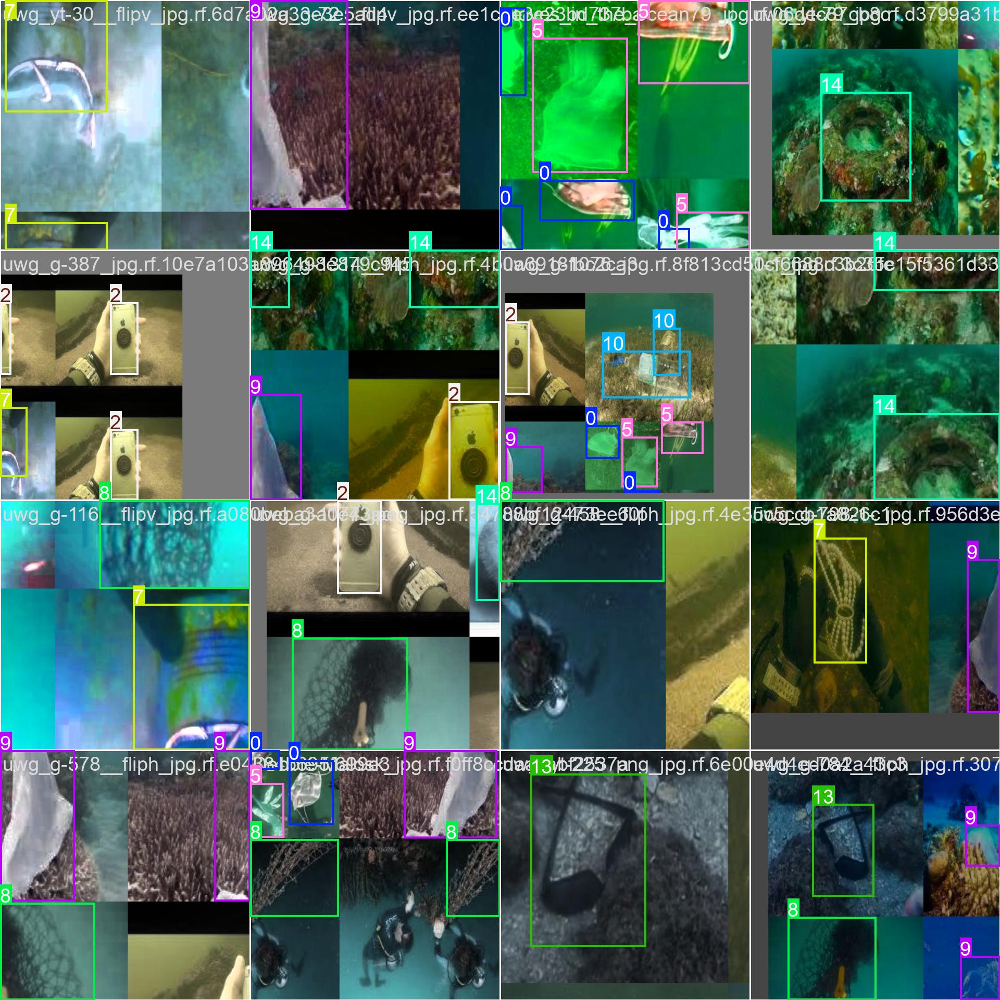

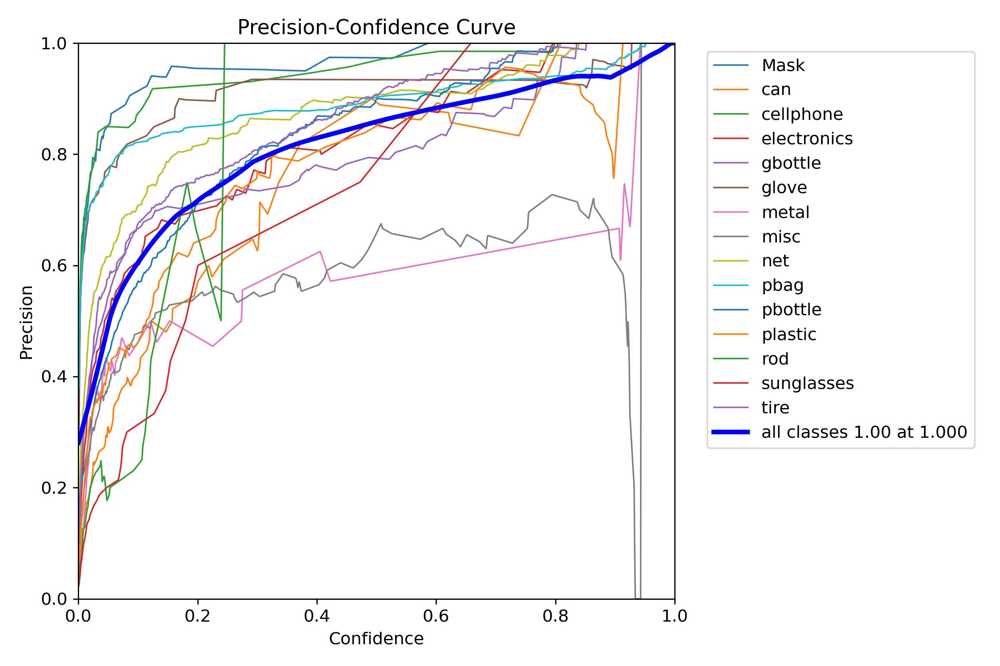

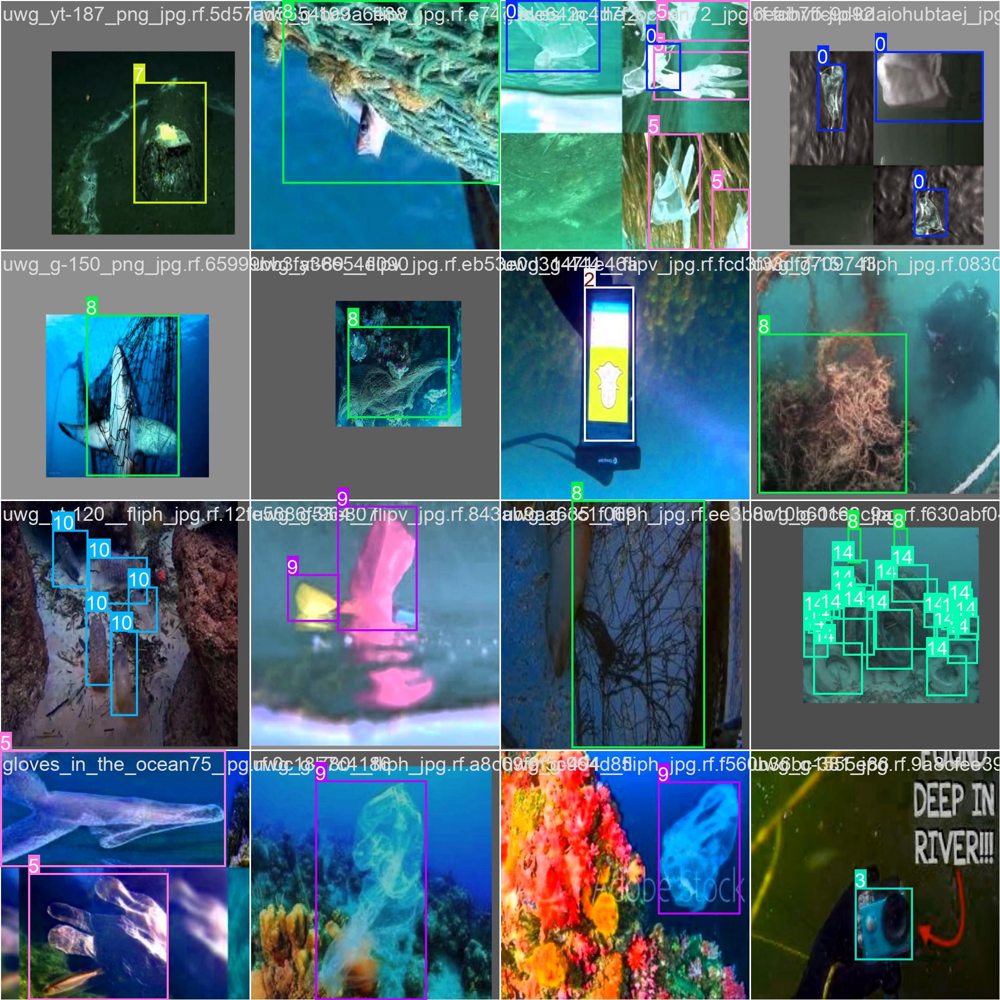

In [ ]:
from IPython.display import Image, display
import os

image_dir = 'runs/detect/yolov10s-underwater-80ep2'  # change if needed
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]

for img_file in image_files:
    display(Image(filename=os.path.join(image_dir, img_file)))

In [ ]:
from ultralytics import YOLO

model = YOLO("runs/detect/yolov10s-underwater-80ep2/weights/best.pt")  # or yolov8n.pt if that's what you used
metrics = model.val(data="/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml", split="test")


Ultralytics 8.3.130 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv10s summary (fused): 106 layers, 7,223,805 parameters, 0 gradients, 21.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 9.0±3.2 MB/s, size: 39.6 KB)


val: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/labels... 501 images, 0 backgrounds, 0 corrupt: 100%|██████████| 501/501 [00:02<00:00, 223.49it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:05<00:00,  5.83it/s]


                   all        501        966      0.726      0.721      0.744      0.472
                  Mask         33         37      0.956      0.514       0.85      0.647
                   can         13         19       0.78      0.579      0.625       0.32
             cellphone         40         46      0.921          1      0.994      0.858
           electronics         14         19      0.834      0.793      0.882      0.584
               gbottle         27         63      0.891      0.517      0.668      0.407
                 glove         23         34      0.932      0.735      0.802      0.658
                 metal          2          5      0.284        0.4      0.352     0.0859
                  misc         30         33      0.723      0.515      0.645      0.331
                   net         63         65      0.846      0.862      0.917      0.628
                  pbag        128        166      0.802      0.958      0.964      0.838
               pbottl

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.7ms preprocess, 5.6ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/val


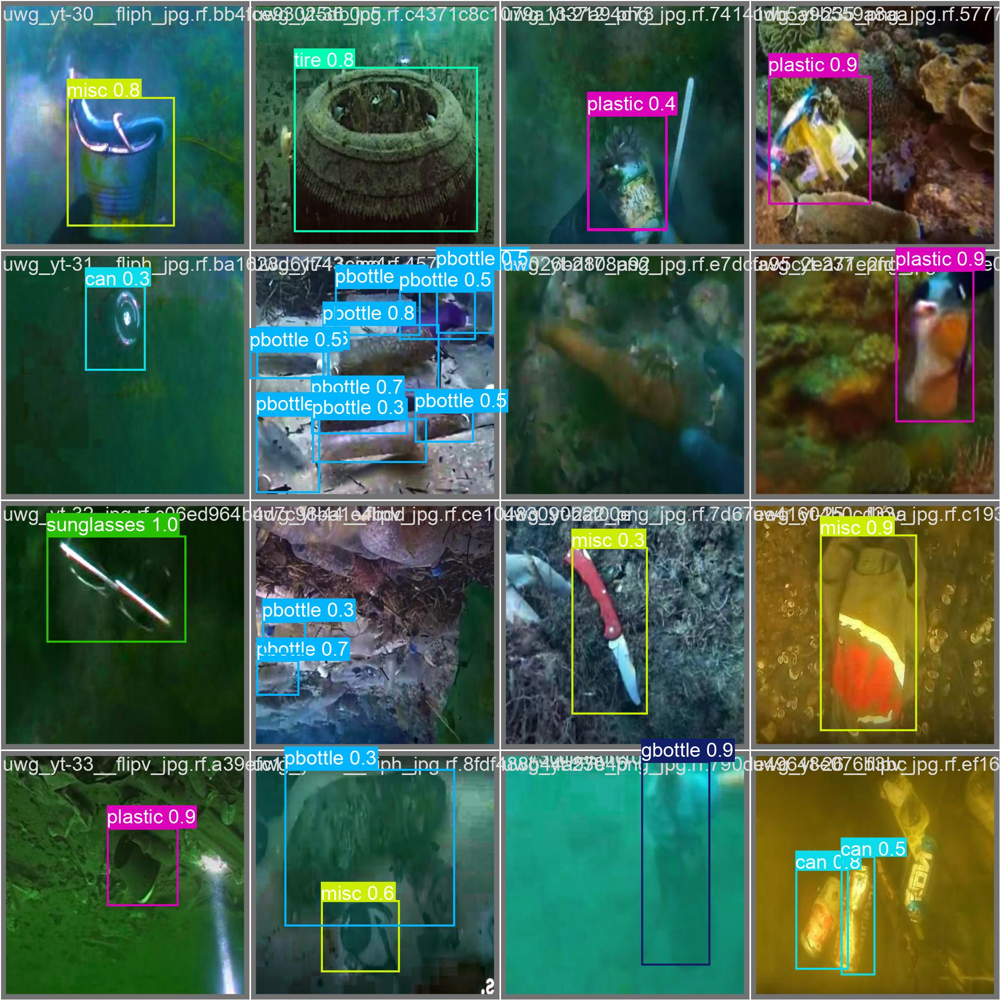

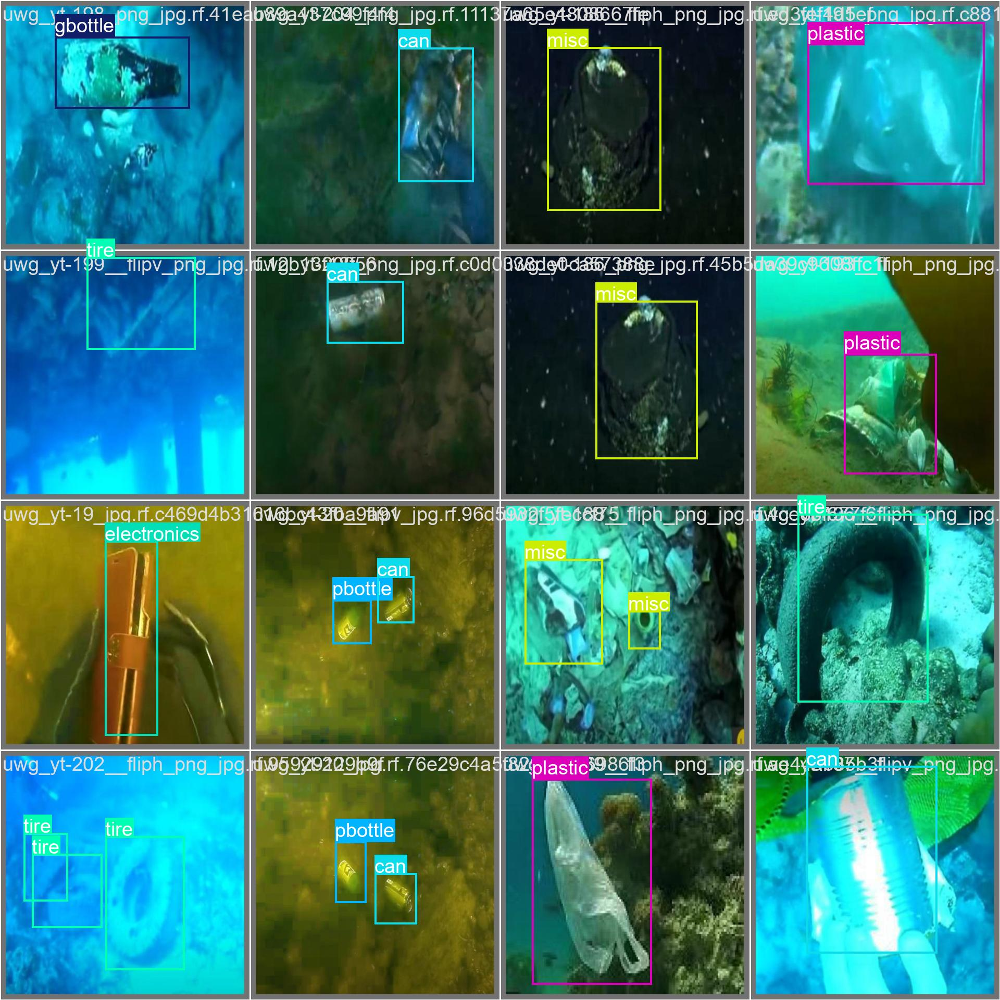

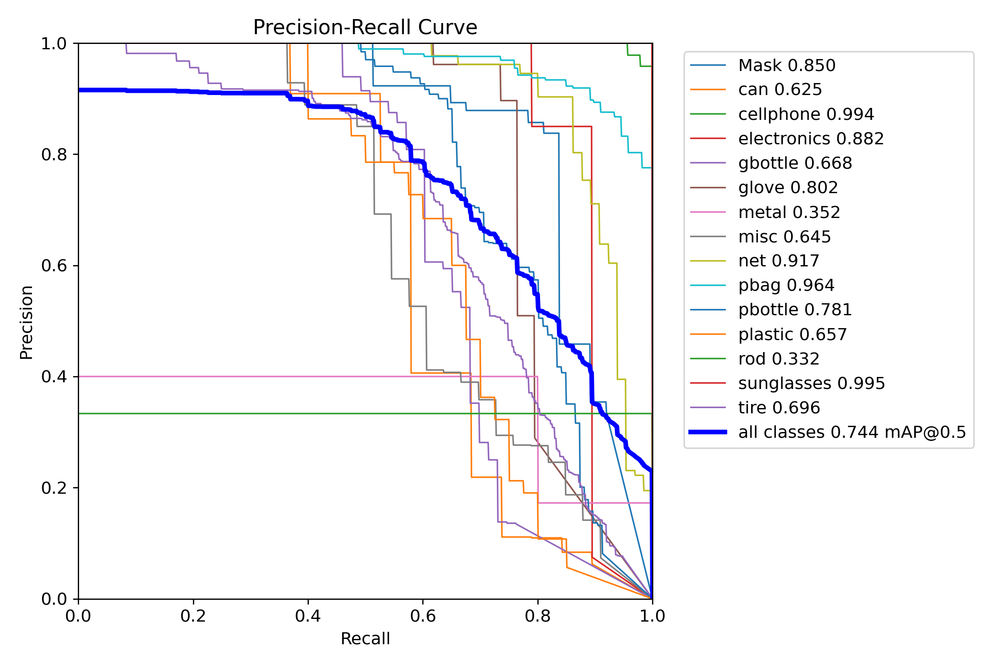

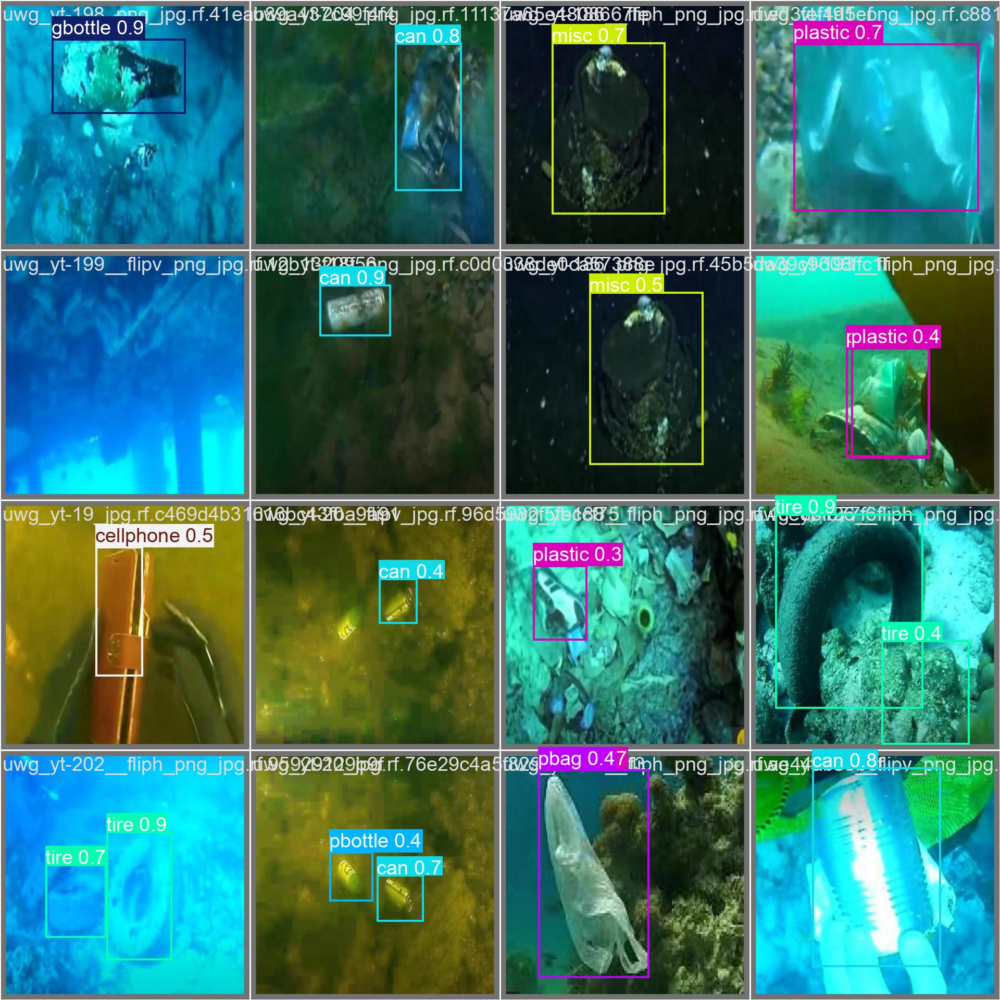

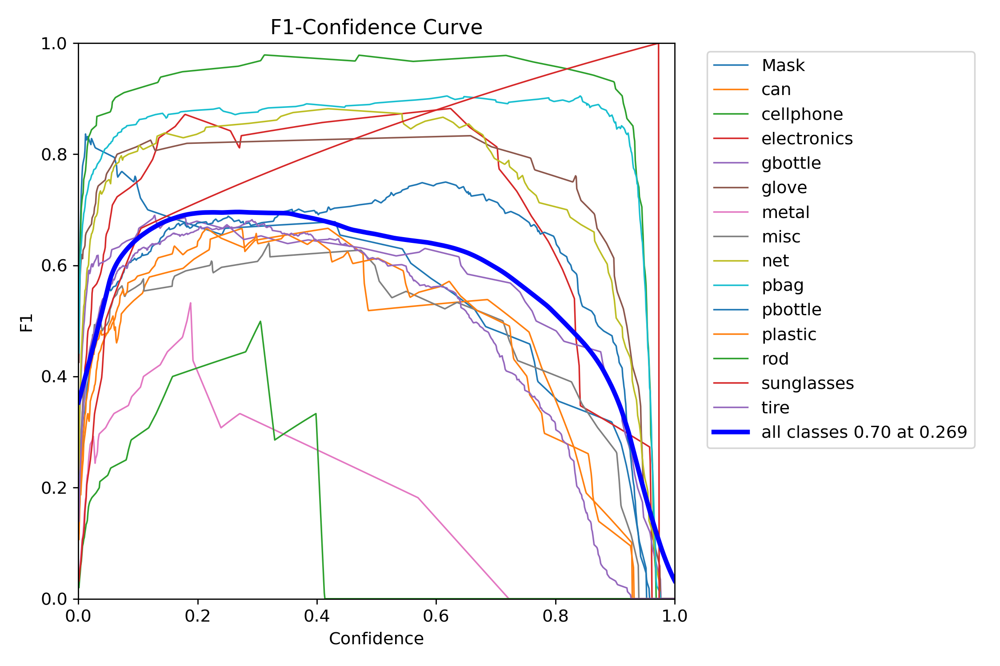

...

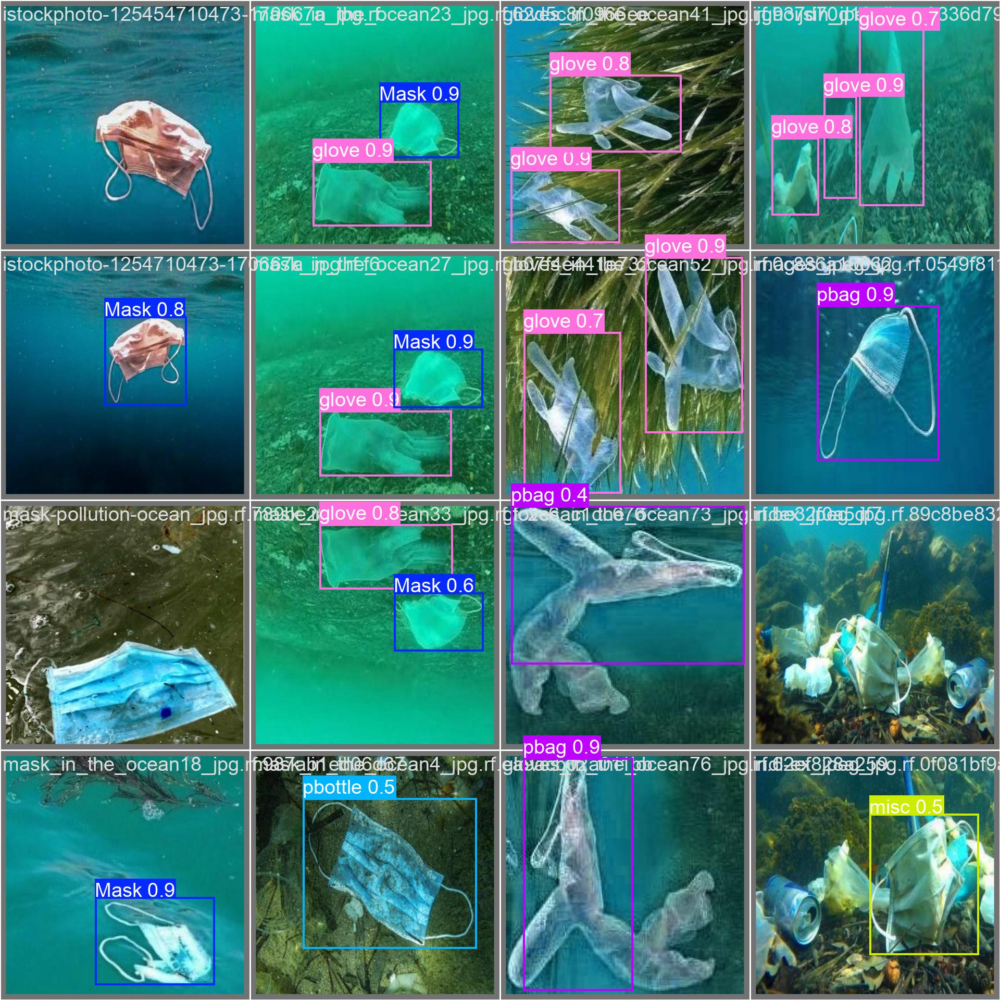

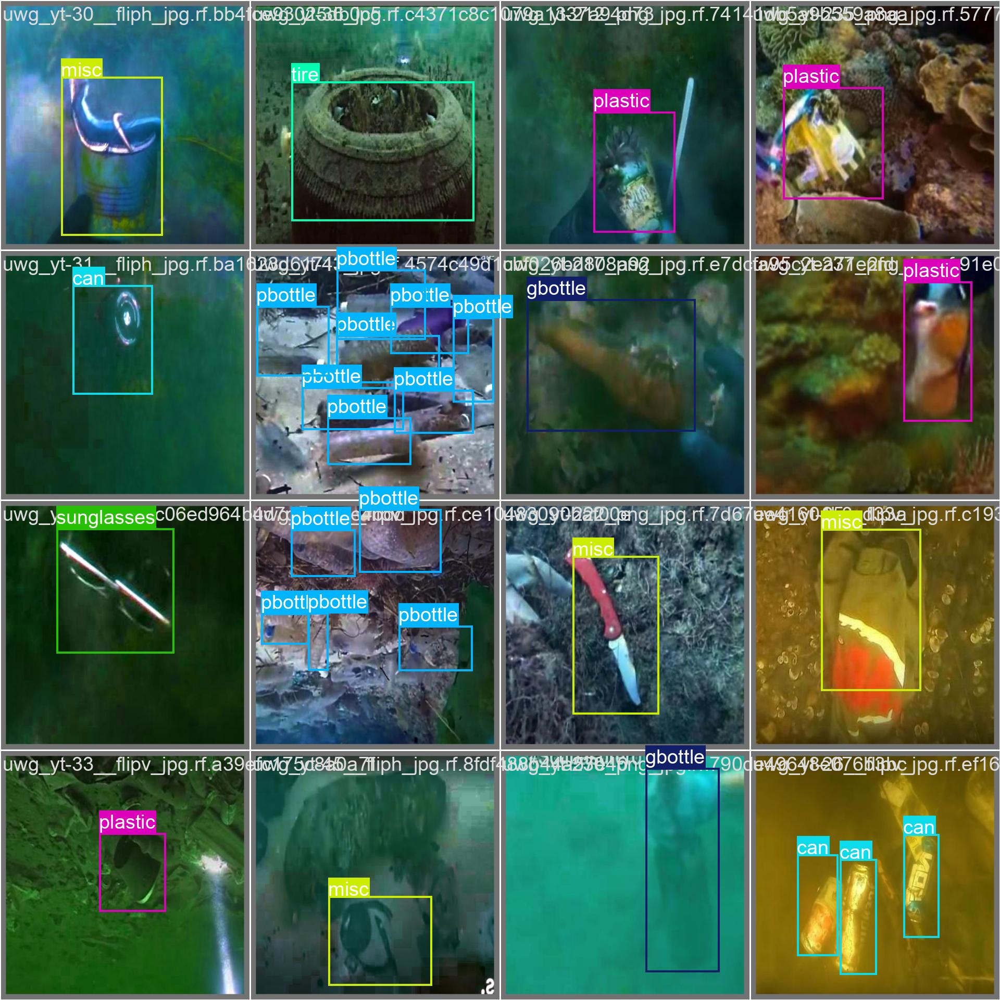

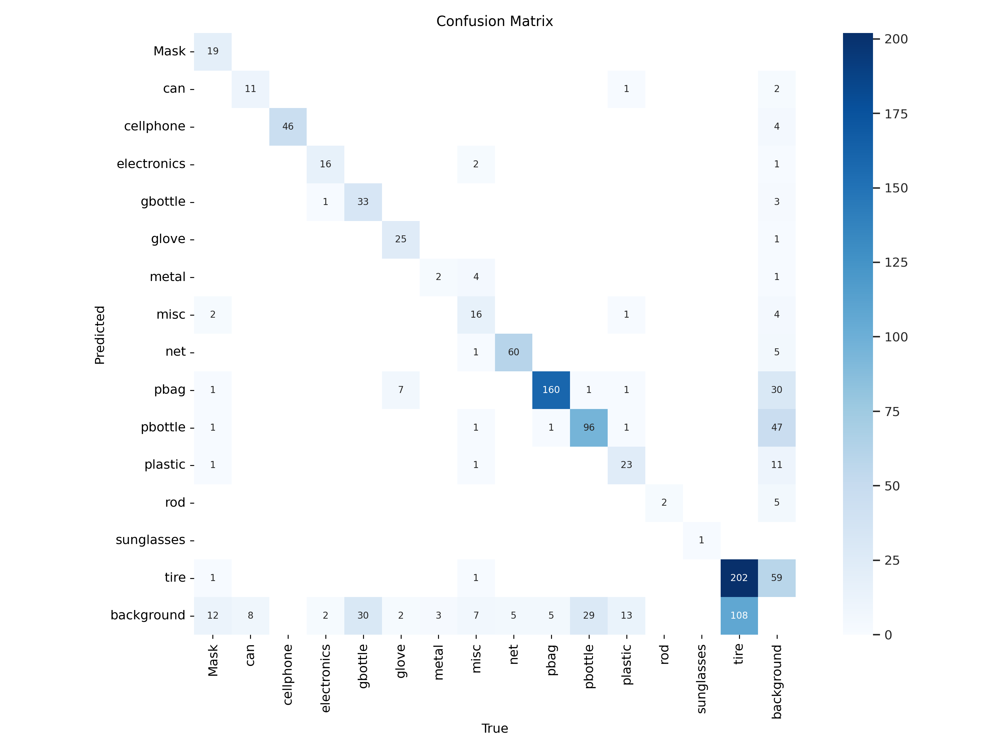

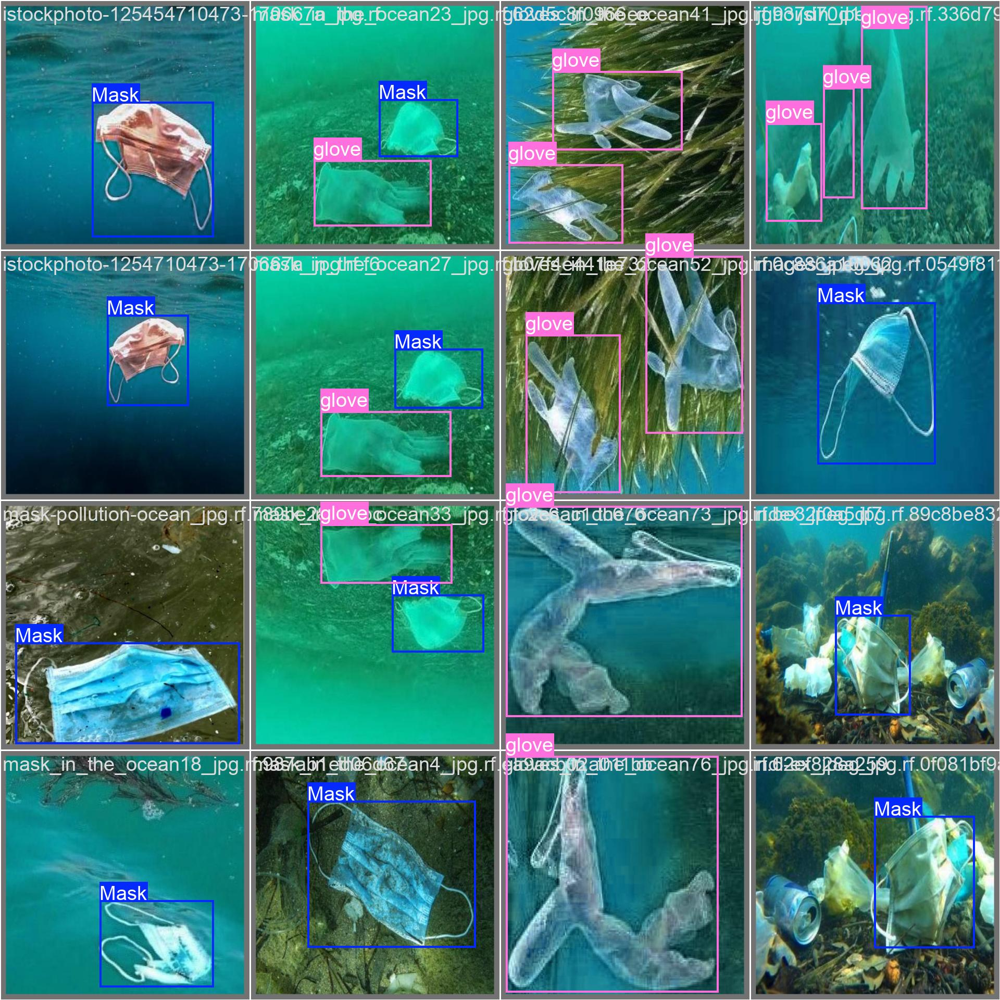

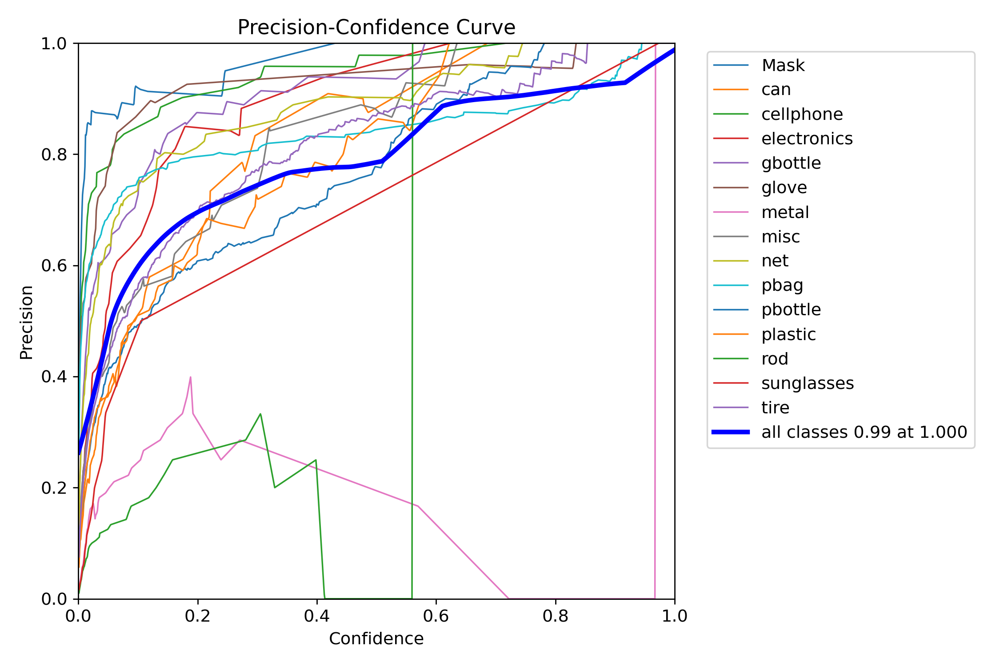

In [ ]:
from IPython.display import Image, display
import os

image_dir = '/kaggle/working/runs/detect/val'  # change if needed
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]

for img_file in image_files:
    display(Image(filename=os.path.join(image_dir, img_file)))
